In [1]:
import sys
sys.path.append('/home/xinyiz/pamrats')

In [21]:
##This is adapted from https://github.com/tkipf/gae/blob/master/gae/train.py and https://github.com/tkipf/pygcn/blob/master/pygcn/train.py##

import time
import os

# Train on CPU (hide GPU) due to memory constraints
# os.environ['CUDA_VISIBLE_DEVICES'] = ""

import scanpy as sc
import numpy as np
import scipy.sparse as sp

import torch
from torch import optim

# from sklearn.metrics import roc_auc_score
# from sklearn.metrics import average_precision_score

import gae.gae.optimizer as optimizer
import gae.gae.model
import gae.gae.preprocessing as preprocessing

import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import umap
import pandas as pd
from sklearn.preprocessing import scale
from sklearn.preprocessing import MinMaxScaler
import pygeodesic.geodesic as geodesic
import json
import matplotlib.image as mpimg
import networkx as nx

from sklearn.neighbors import NearestNeighbors
from sklearn.metrics.pairwise import euclidean_distances

In [3]:
datadir='/mnt/external_ssd/xinyi/staci_validation/10xVisiumADFFPE/'
tissuepospath='VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_aggr_tissue_positions_list.csv'
tissuepos=pd.read_csv(os.path.join(datadir,tissuepospath),header=None)

tissuepos.index=tissuepos.iloc[:,0]
# scalefactor=0.150015
libraryID=pd.read_csv(os.path.join(datadir,'VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_aggregation.csv'))
features=sc.read_10x_h5(os.path.join(datadir,'VisiumFFPE_Mouse_Brain_Alzheimers_AppNote_filtered_feature_bc_matrix.h5'))

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [17]:
features.obs['x']=tissuepos.loc[features.obs.index,4]
features.obs['y']=tissuepos.loc[features.obs.index,5]
features.obs['barcodes']=features.obs.index
sampleidx=features.obs['barcodes'].apply(lambda x: x.split('-')[1])
samplenameList=np.zeros(sampleidx.size).astype(str)
for s in np.unique(sampleidx):
    samplenameList[sampleidx==s]=libraryID['library_id'][int(s)-1]
features.obs['samplename']=samplenameList
features.var_names_make_unique()
features=features[:,np.array(np.sum(features.X,axis=0)>3).flatten()]

In [40]:
# Settings
# os.environ["CUDA_VISIBLE_DEVICES"] = "2" 
cudadevice0=0
cudadevice1=1
use_cuda=True
fastmode=False #Validate during training pass
seed=3
useSavedMaskedEdges=True
maskedgeName='knn6_connectivity'
nneighbors=6
epochs=6510
saveFreq=130
lr=0.01 #initial learning rate
lr_adv=0.001
weight_decay=0 #Weight for L2 loss on embedding matrix.

hidden1=30000 #Number of units in hidden layer 1
hidden2=30000 #Number of units in hidden layer 2
fc_dim1=30000
adv_hidden=128

dropout=0.01
testNodes=0.1 #fraction of total nodes for testing
valNodes=0.05 #fraction of total nodes for validation
XreconWeight=240
# clfweight=20
advWeight=2
# randFeatureSubset=None
model_str='gcn_vae_xa_e2_d1_dca_sharded'
clf=None
adv=None #'clf_fc1_control_eq' #'clf_fc1'
protein=None #'scaled_binary'
proteinWeights=0.05
adj_decodeName=None #gala or None
ridgeL=0.01
shareGenePi=True

pretrainedAE=None #{'name':'controlphy5XAbin_01_dca','epoch':9990}
targetBatch=None #'control13'
training_sample_X='logminmax'
switchFreq=10
standardizeX=False
name='10xAD_01_dca_over' 
logsavepath='/mnt/external_ssd/xinyi/log/train_gae_visium_validation/'+name
modelsavepath='/mnt/external_ssd/xinyi/models/train_gae_visium_validation/'+name
plotsavepath='/mnt/external_ssd/xinyi/plots/train_gae_visium_validation/'+name

if not os.path.exists(logsavepath):
    os.mkdir(logsavepath)
if not os.path.exists(modelsavepath):
    os.mkdir(modelsavepath)
if not os.path.exists(plotsavepath):
    os.mkdir(plotsavepath)


# Set cuda and seed
np.random.seed(seed)
if use_cuda and (not torch.cuda.is_available()):
    print('cuda not available')
    use_cuda=False
torch.manual_seed(seed)
if use_cuda:
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.enabled = True

# Load data
# if randFeatureSubset != None:
#     idx=np.random.choice(features.shape[1],randFeatureSubset,replace=False)
#     features=features[:,idx]


In [19]:
def getA_knn(samplename,k,a_mode,savepath=None):
    sobj_coord_np=features.obs.loc[features.obs.index[features.obs['samplename']==samplename],['x','y']].to_numpy()
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(sobj_coord_np)
    a=nbrs.kneighbors_graph(sobj_coord_np,mode=a_mode)
    if a_mode=='connectivity':
        a=a-sp.identity(sobj_coord_np.shape[0],format='csr')
    if a_mode=='distance':
        a[a!=0]=1/a[a!=0]
    if savepath !=None:
        sp.save_npz(savepath,a)
    return a

In [32]:
def plotA(coord,adj):
    g=nx.from_numpy_matrix(adj)
    pos={}
    for n in range(coord.shape[0]):
        pos[n]=(coord[n][0],coord[n][1])
    fig, ax = plt.subplots(dpi=400)
    nx.draw(g,pos,node_size=1,width=0.1)
    plt.savefig(os.path.join(plotsavepath,samplename+'_connectedA'))
    plt.show()

In [35]:
# for f in os.listdir:
savedirlist={}
featureslist={}
features_raw_list={}
adj_list={}
coordlist={}
commonGenes=[]
    
for samplename in np.unique(features.obs['samplename']):
    print(samplename)
    
    adj_list[samplename]=getA_knn(samplename,nneighbors+1,'connectivity')
    if training_sample_X=='logminmax':
        featurelog_train=np.log2(features.X[features.obs['samplename']==samplename].toarray()+1/2)
        scaler = MinMaxScaler()
        featurelog_train_minmax=np.transpose(scaler.fit_transform(np.transpose(featurelog_train)))
        featureslist[samplename+'X_'+training_sample_X]=torch.tensor(featurelog_train_minmax)
    features_raw_list[samplename+'X_'+'raw']=torch.tensor(features.X[features.obs['samplename']==samplename].toarray())

    
num_features=features.shape[1]
print(num_features)
adjnormlist={}
pos_weightlist={}
normlist={}
for ai in adj_list.keys():
    adjnormlist[ai]=preprocessing.preprocess_graph(adj_list[ai])
    
    pos_weightlist[ai] = torch.tensor(float(adj_list[ai].shape[0] * adj_list[ai].shape[0] - adj_list[ai].sum()) / adj_list[ai].sum()) #using full unmasked adj
    normlist[ai] = adj_list[ai].shape[0] * adj_list[ai].shape[0] / float((adj_list[ai].shape[0] * adj_list[ai].shape[0] - adj_list[ai].sum()) * 2)
    
    adj_label=adj_list[ai] + sp.eye(adj_list[ai].shape[0])
    adj_list[ai]=torch.tensor(adj_label.toarray())
    
        

17186
0
0
0
0
0
0
0
0
0
0
0
0


Transgenic_17p9_rep1


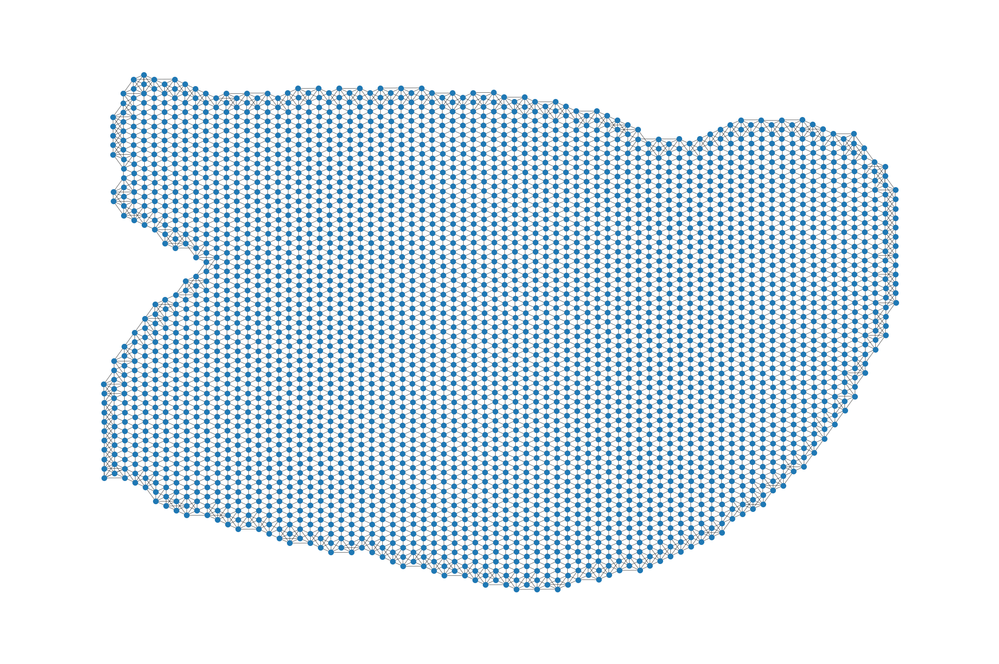

Transgenic_17p9_rep2


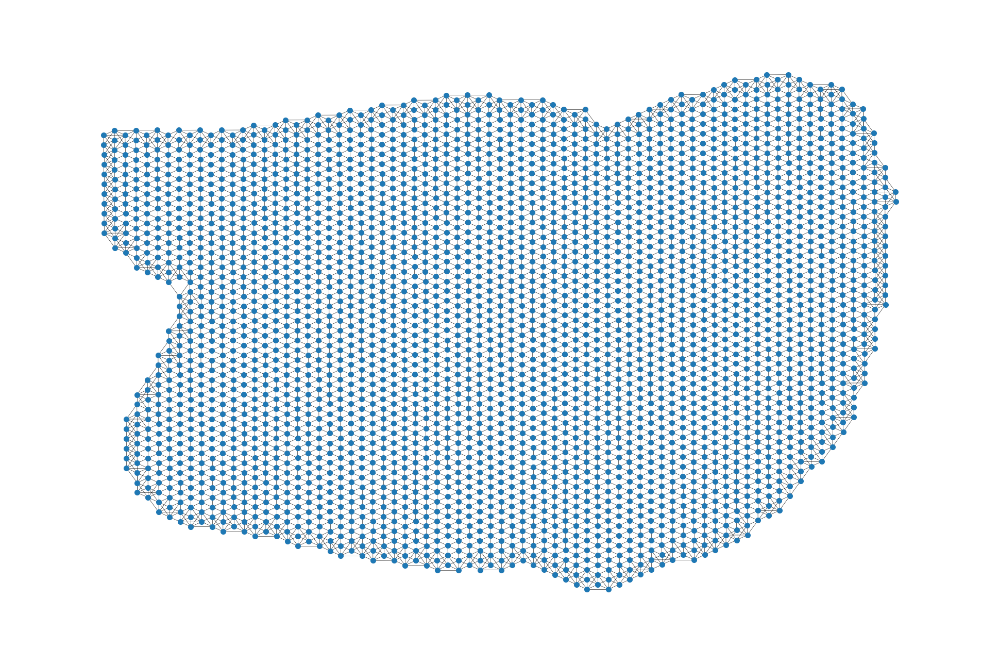

Transgenic_2p5_rep1


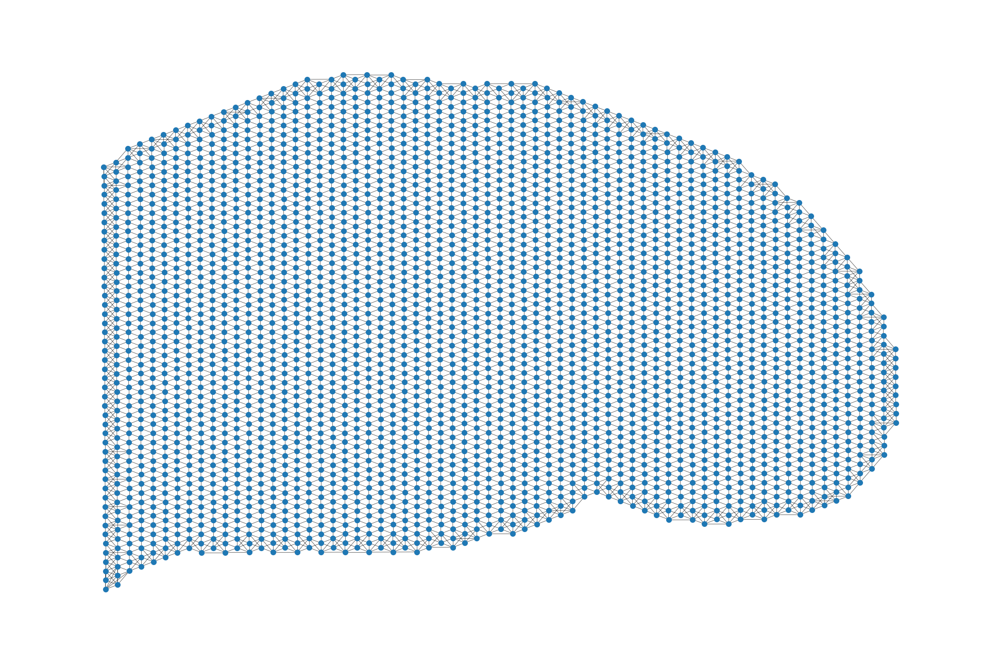

Transgenic_2p5_rep2


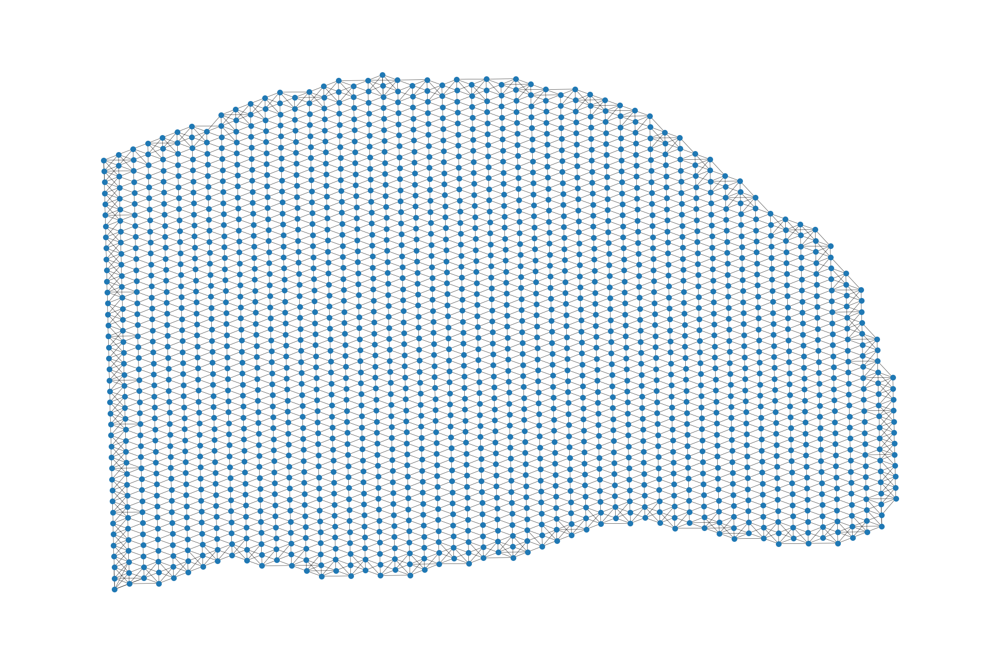

Transgenic_5p7_rep1


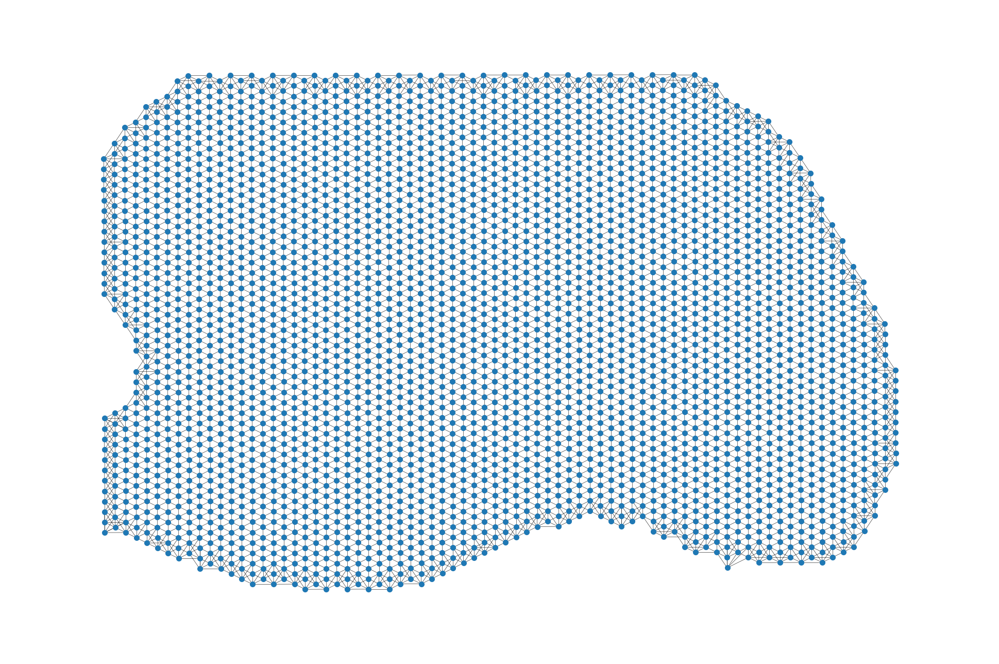

Transgenic_5p7_rep2


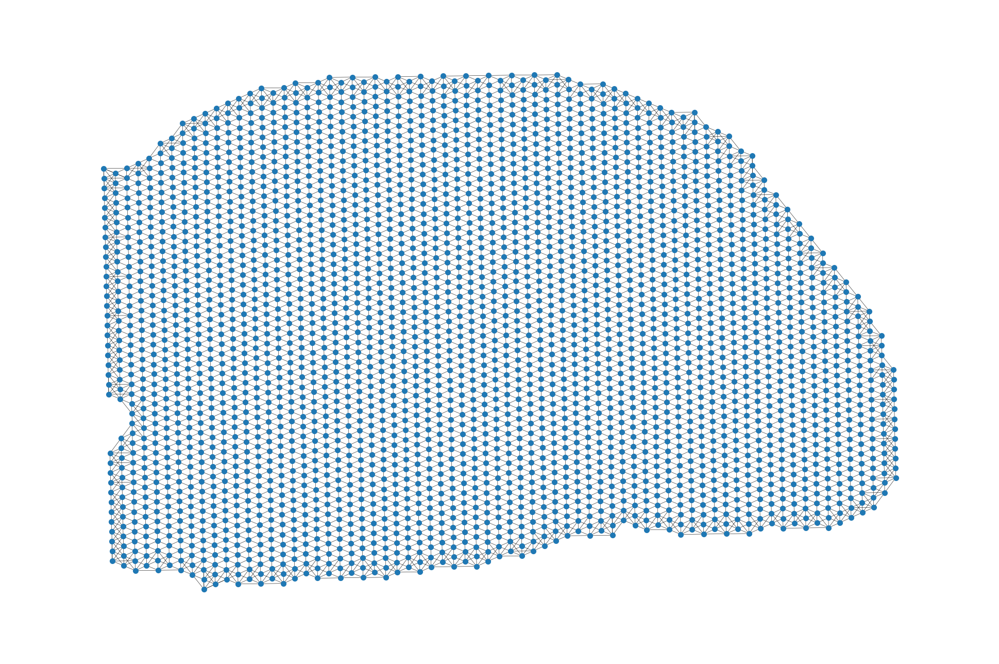

Wildtype_13p4_rep1


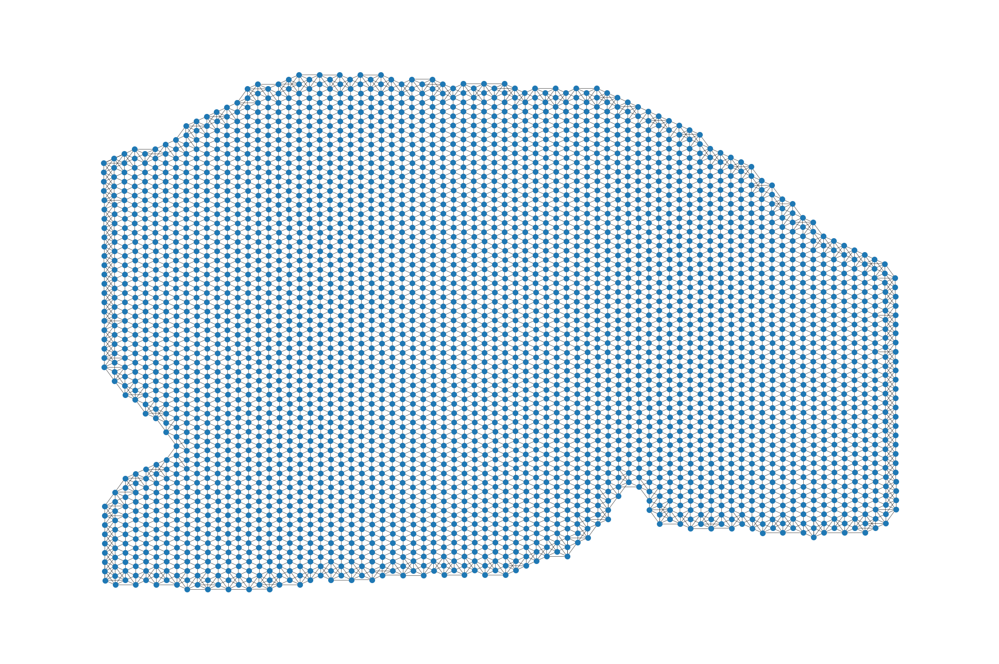

Wildtype_13p4_rep2


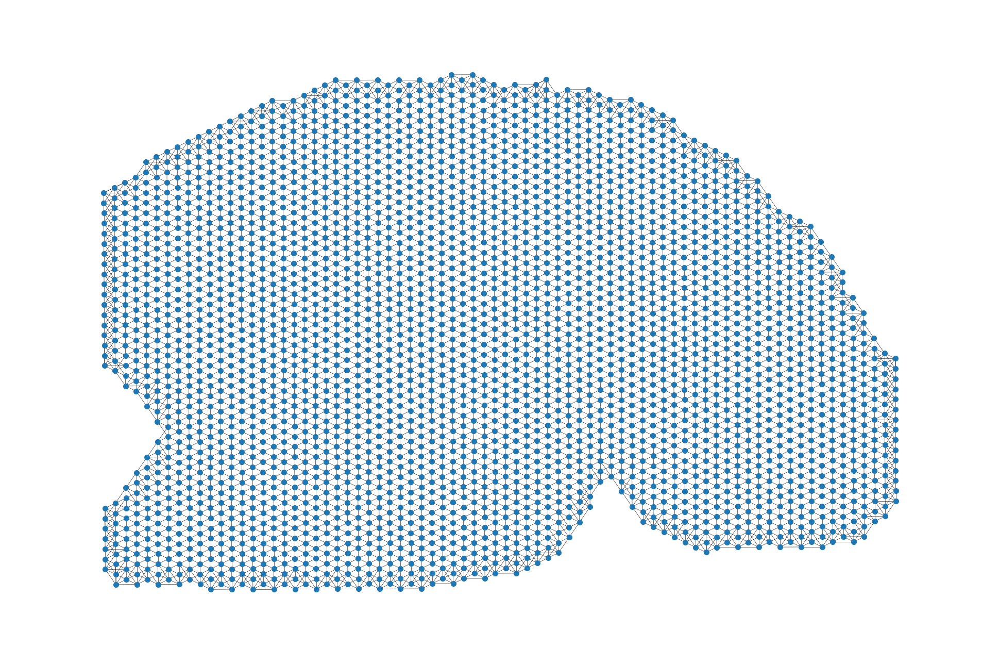

Wildtype_2p5_rep1


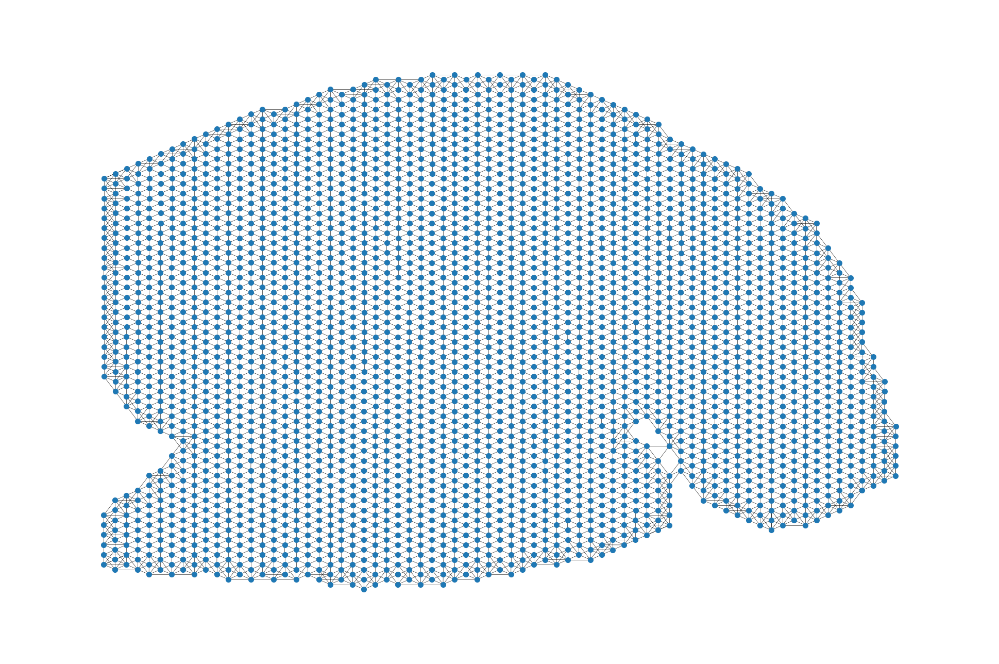

Wildtype_2p5_rep2


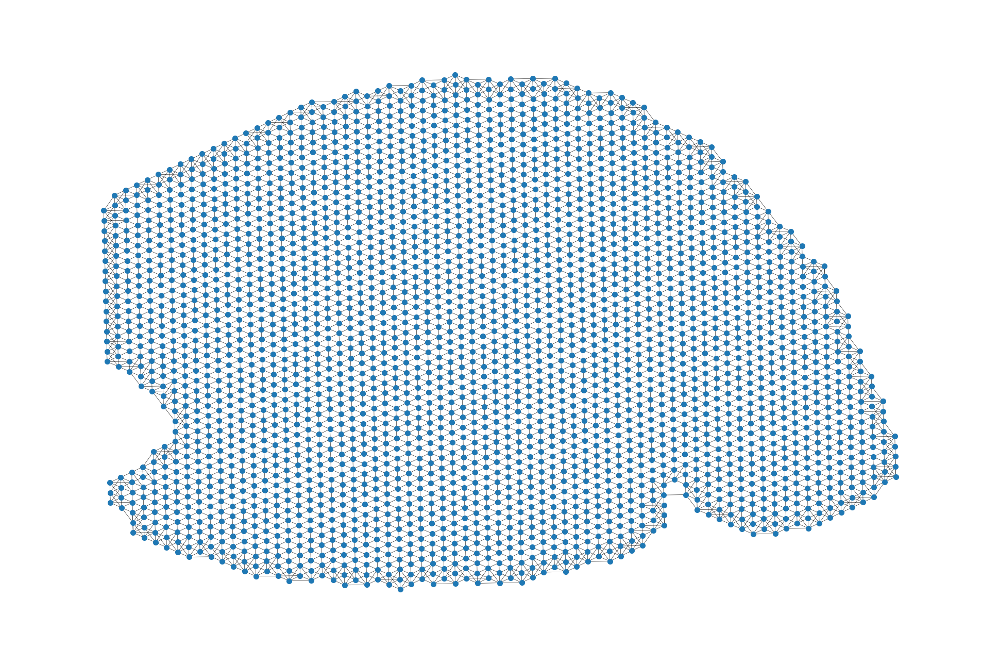

Wildtype_5p7_rep1


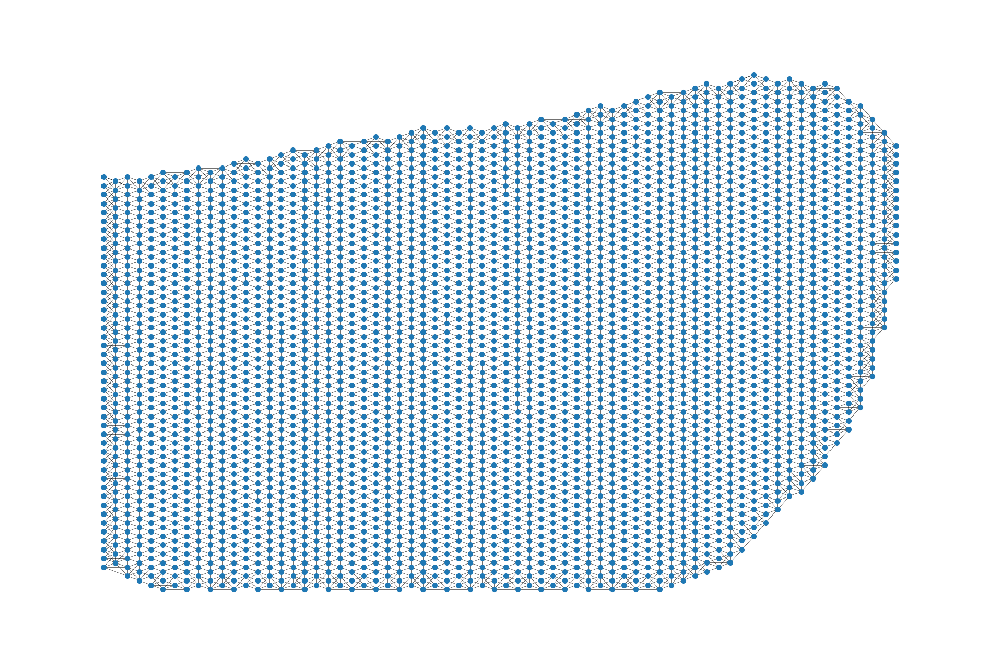

Wildtype_5p7_rep2


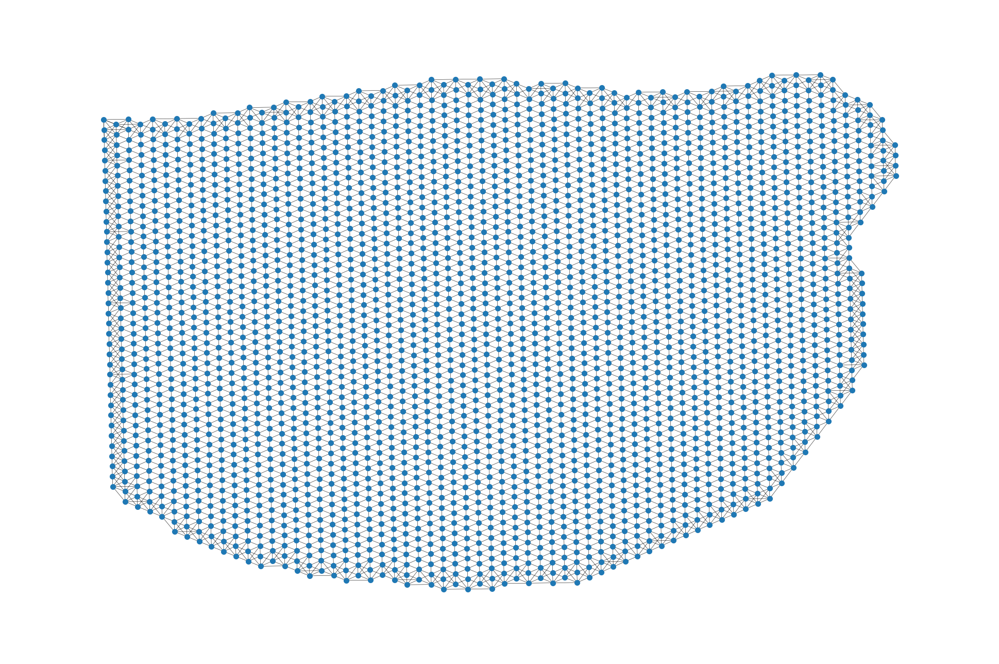

In [38]:
for samplename in adj_list.keys():
    print(samplename)
    sobj_coord_np=features.obs.loc[features.obs.index[features.obs['samplename']==samplename],['x','y']].to_numpy()
    plotA(sobj_coord_np,adj_list[samplename].numpy()-sp.eye(sobj_coord_np.shape[0]))



In [39]:
# loop over all train/validation sets

mse=torch.nn.MSELoss()
# mse=torch.nn.MSELoss(reduction=None)
# Create model
if model_str=='gcn_vae_xa':
    model = gae.gae.model.GCNModelVAE_XA(num_features, hidden1, hidden2,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
elif model_str == 'gcn_vae_gcnX_inprA':
    model = gae.gae.model.GCNModelVAE_gcnX_inprA(num_features, hidden1, hidden2,gcn_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str == 'gcn_vae_gcnX_inprA_w':
    model = gae.gae.model.GCNModelVAE_gcnX_inprA_w(num_features, hidden1, hidden2,gcn_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE    
    
elif model_str=='gcn_vae_xa_e3':
    model = gae.gae.model.GCNModelVAE_XA_e3(num_features, hidden1, hidden2,hidden3,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str == 'gcn_vae_xa_e1':
    model = gae.gae.model.GCNModelVAE_XA_e1(num_features, hidden1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE

elif model_str == 'gcn_vae_xa_e2_d1':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1(num_features, hidden1,hidden2, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca_sharded':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_sharded(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE
    
elif model_str=='gcn_vae_xa_e2_d1_dca_fca':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_fca(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaFork':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCAfork(num_features, hidden1,hidden2,fc_dim1, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaElemPi':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCAelemPi(num_features, hidden1,hidden2,fc_dim1, dropout,shareGenePi)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE

elif model_str=='gcn_vae_xa_e2_d1_dcaConstantDisp':
    model = gae.gae.model.GCNModelVAE_XA_e2_d1_DCA_constantDisp(num_features, hidden1,hidden2,fc_dim1, dropout,shareGenePi)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_zinb
    loss_a=optimizer.optimizer_CE    
    
elif model_str == 'gcn_vae_xa_e4_d1':
    model = gae.gae.model.GCNModelVAE_XA_e4_d1(num_features, hidden1,hidden2,hidden3,hidden4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
    loss_a=optimizer.optimizer_CE    
    
elif model_str=='fc':
    model = gae.gae.model.FCVAE(num_features, hidden1, hidden2,hidden3,hidden4,hidden5,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_kl=optimizer.optimizer_kl
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse
    loss_a=optimizer.optimizer_CE
elif model_str=='fcae':
    model = gae.gae.model.FCAE(num_features, hidden1, hidden2,hidden3,hidden4,hidden5,fc_dim1,fc_dim2,fc_dim3,fc_dim4, dropout)
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse

elif model_str=='fcae1':
    model = gae.gae.model.FCAE1(num_features, dropout,hidden1)
    loss_x=optimizer.optimizer_MSE
#     loss_x=mse
elif model_str=='fcae2':
    model = gae.gae.model.FCAE2(num_features, dropout,hidden1,hidden2)
    loss_x=optimizer.optimizer_MSE

elif model_str=='fc1':
    model = gae.gae.model.FCVAE1(num_features, hidden1,dropout)
    loss_x=optimizer.optimizer_MSE
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE

elif model_str=='fc1_fca':
    model = gae.gae.model.FCVAE1_fca(num_features, hidden1,dropout)
    loss_x=optimizer.optimizer_MSE
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE
    
elif model_str=='fc1_dca':
    model = gae.gae.model.FCVAE1_DCA(num_features, hidden1,fc_dim1, dropout)
    loss_x=optimizer.optimizer_zinb
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE
    
elif model_str=='fc1_dca_sharded':
    model = gae.gae.model.FCVAE1_DCA_sharded(num_features, hidden1,fc_dim1, dropout)
    loss_x=optimizer.optimizer_zinb
    loss_kl=optimizer.optimizer_kl
    loss_a=optimizer.optimizer_CE

if clf=='clf_fc1':
    modelClf=gae.gae.model.Clf_fc1(hidden2, dropout,clf_hidden,ct_unique.size)
    loss_clf=torch.nn.CrossEntropyLoss()
    
if adv=='clf_fc1' or adv=='clf_fc1_eq' or adv=='clf_fc1_control' or adv=='clf_fc1_control_eq':
    modelAdv=gae.gae.model.Clf_fc1(hidden2, dropout,adv_hidden,sampleLabellist_ae['control13'].size()[1])
    loss_adv=optimizer.optimizer_CEclf
    

# if use_cuda:
#     model.cuda()
#     if clf:
#         modelClf.cuda()
#         ct_train=torch.tensor(ct_train).cuda()
#     if adv:
#         modelAdv.cuda()
#         for sk in sampleLabellist_ae.keys():
#             sampleLabellist_ae[sk]=sampleLabellist_ae[sk].cuda().float()
#             sampleLabellist_d[sk]=sampleLabellist_d[sk].cuda().float()
#     for fk in featureslist.keys():
#         featureslist[fk] = featureslist[fk].cuda().float()
#     for ak in adj_list.keys():
#         adjnormlist[ak] =adjnormlist[ak].cuda()
#         adj_list[ak] = adj_list[ak].cuda().float()
#     if adj_decode is not None:
#         adj_decode=adj_decode.cuda()
    

optimizerVAEXA = optim.SGD(model.parameters(), lr=lr, weight_decay=weight_decay)
if clf:
    optimizerClf=optim.Adam(modelClf.parameters(), lr=lr, weight_decay=weight_decay)
if adv:
    optimizerAdv=optim.Adam(modelAdv.parameters(), lr=lr_adv, weight_decay=weight_decay)    


In [43]:
# if pretrainedAE:
#     print('loading '+pretrainedAE['name']+' epoch '+str(pretrainedAE['epoch']))
#     model.load_state_dict(torch.load(os.path.join('/mnt/xinyi/pamrats/models/train_gae_starmap/'+pretrainedAE['name'],str(pretrainedAE['epoch'])+'.pt')))
# model.load_state_dict(torch.load(os.path.join(modelsavepath,str(1650)+'.pt')))
    
def train(epoch):
    t = time.time()
    model.train()
    optimizerVAEXA.zero_grad(True)
    
    if adj_decodeName==None:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm)
    #     features_recon, z, mu, logvar=model(features.float())
    else:
        adj_recon,mu,logvar,z,features_recon = model(features, adj_norm,adj_decode)
        
    adj_recon=adj_recon.cuda(0)
    mu=mu.cuda(0)
    logvar=logvar.cuda(0)
    z=z.cuda(0)
#     features_recon=features_recon.cuda(0)
    
    if clf:
        modelClf.train()
        optimizerClf.zero_grad()
        clfOut=modelClf(z)
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
        modelAdv.eval()
        advOut=modelAdv(z)
    
    loss_kl_train=loss_kl(mu, logvar, train_nodes_idx)
    if 'dca' in model_str:
        loss_x_train=loss_x(features_recon, features.cuda(0),train_nodes_idx,XreconWeight,ridgeL,features_raw)
    else:
        loss_x_train=loss_x(features_recon, features.cuda(0),train_nodes_idx,XreconWeight,mse)
    loss_a_train=loss_a(adj_recon, adj_label, pos_weight, norm,train_nodes_idx)
    loss = loss_kl_train+loss_x_train+loss_a_train
#     loss=loss_x_train #for lossXreconOnly only
#     loss=loss_kl_train+loss_x_train #for lossXreconOnly_wKL only
#     loss = loss_kl_train+loss_a_train #for lossAreconOnly_wKL only
    if clf:
        loss_clf_train=loss_clf(clfOut[train_nodes_idx],ct_train[train_nodes_idx])
        loss=loss+clfweight*loss_clf_train
    if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
        loss_adv_train=loss_adv(advOut,sampleLabel_ae,train_nodes_idx)
        loss+=loss_adv_train*advWeight
    loss.backward()
    optimizerVAEXA.step()
    if clf:
        optimizerClf.step()
        
    with torch.no_grad():
        if not fastmode:
            # Evaluate validation set performance separately,
            # deactivates dropout during validation run & no variation in z.
            model.eval()
            if adj_decodeName==None:
                adj_recon,mu,logvar,z, features_recon = model(features, adj_norm)
        #         features_recon, z, mu, logvar=model(features.float())
            else:
                adj_recon,mu,logvar,z, features_recon = model(features, adj_norm,adj_decode)

        adj_recon=adj_recon.cuda(0)
        mu=mu.cuda(0)
        logvar=logvar.cuda(0)
        z=z.cuda(0)
    #     features_recon=features_recon.cuda(0)

        if clf:
            modelClf.eval()
            clfOut=modelClf(z)
        if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
            advOut=modelAdv(z)
        if 'dca' in model_str:
            loss_x_val=loss_x(features_recon, features.cuda(0),val_nodes_idx,XreconWeight,ridgeL,features_raw)
        else:
            loss_x_val=loss_x(features_recon, features,val_nodes_idx,XreconWeight,mse)
        loss_a_val=loss_a(adj_recon, adj_label, pos_weight, norm,val_nodes_idx)
        loss_val = loss_x_val+loss_a_val
#         loss_val=loss_x_val
    #     loss_val=loss_a_val
        if clf:
            loss_clf_val=loss_clf(clfOut[val_nodes_idx],ct_train[val_nodes_idx])
            loss_val=loss_val+clfweight*loss_clf_val
        if adv and (training_samples_t in list(sampleLabellist_ae.keys())) and (training_samples_t != targetBatch):
            loss_adv_val=loss_adv(advOut,sampleLabel_ae,val_nodes_idx)
            loss_val+=loss_adv_val*advWeight
#     print(features_recon[:5,:5])
    print(training_samples_t+' Epoch: {:04d}'.format(epoch),
#           'loss_train: {:.4f}'.format(loss.item()),
          'loss_kl_train: {:.4f}'.format(loss_kl_train.item()),
          'loss_x_train: {:.4f}'.format(loss_x_train.item()),
          'loss_a_train: {:.4f}'.format(loss_a_train.item()),
#           'loss_clf_train: {:.4f}'.format(loss_clf_train.item()),
#           'loss_val: {:.4f}'.format(loss_val.item()),
          'loss_x_val: {:.4f}'.format(loss_x_val.item()),
          'loss_a_val: {:.4f}'.format(loss_a_val.item()),
#           'loss_clf_val: {:.4f}'.format(loss_clf_val.item()),
          'time: {:.4f}s'.format(time.time() - t))
    return time.time() - t,float(loss),float(loss_kl_train),float(loss_x_train),float(loss_a_train),float(loss_val),float(loss_x_val),float(loss_a_val)        

    
# print('cross-validation ',seti)
train_loss_ep=[None]*epochs
train_loss_kl_ep=[None]*epochs
train_loss_x_ep=[None]*epochs
train_loss_a_ep=[None]*epochs
train_loss_clf_ep=[None]*epochs
train_loss_adv_ep=[None]*epochs
train_loss_advD_ep=[None]*epochs
val_loss_ep=[None]*epochs
val_loss_x_ep=[None]*epochs
val_loss_a_ep=[None]*epochs
val_loss_clf_ep=[None]*epochs
val_loss_adv_ep=[None]*epochs
val_loss_advD_ep=[None]*epochs

timePerEpoch=[None]*epochs

t_ep=time.time()

def trace_handler(p):
    output = p.key_averages().table(sort_by="self_cuda_time_total", row_limit=-1)
    with open(os.path.join(plotsavepath,'trace',str(p.step_num) + ".txt"), 'a') as f:
        f.write(output)
    outputtest = p.key_averages().table(sort_by="self_cuda_time_total", row_limit=10)
    print(output)
    p.export_chrome_trace(os.path.join(plotsavepath,'trace',str(p.step_num) + ".json"))

with torch.profiler.profile(
    activities=[torch.profiler.ProfilerActivity.CPU, torch.profiler.ProfilerActivity.CUDA],
    profile_memory=True,
    schedule=torch.profiler.schedule(
        wait=1,
        warmup=3,
        active=6),
    on_trace_ready=trace_handler
) as p:        

    for ep in range(epochs):
    # for ep in range(10000,20000):
        t=int(ep/switchFreq)%len(training_samples)
        training_samples_t=training_samples[t]

        adj_norm=adjnormlist[training_samples_t]
    #     adj_label=adj_list[training_samples_t]
        features=featureslist[training_samples_t+'X_'+training_sample_X]
    #     adj_norm=adjnormlist[training_samples_t].cuda().float()
        adj_label=adj_list[training_samples_t].cuda(0).float()
    #     features=featureslist[training_samples_t+'X_'+training_sample_X].cuda().float()
        pos_weight=pos_weightlist[training_samples_t]
        norm=normlist[training_samples_t]
        if adv and (training_samples_t in list(sampleLabellist_ae.keys())):
    #         sampleLabel_ae=sampleLabellist_ae[training_samples_t]
    #         sampleLabel_d=sampleLabellist_d[training_samples_t]
            sampleLabel_ae=sampleLabellist_ae[training_samples_t].cuda().float()
            sampleLabel_d=sampleLabellist_d[training_samples_t].cuda().float()
        if 'dca' in model_str:
    #         features_raw=features_raw_list[training_samples_t+'X_raw']
            features_raw=features_raw_list[training_samples_t+'X_raw'].cuda()
        num_nodes,_ = features.shape

        maskpath=os.path.join(savedir,'trainMask',training_samples_t+'_'+maskedgeName+'_seed'+str(seed)+'.pkl')
    #     if useSavedMaskedEdges and os.path.exists(maskpath):
    # #         print('opening saved')
    #         with open(maskpath, 'rb') as input:
    #             maskedgeres = pickle.load(input)
    #     else:
            # construct training, validation, and test sets
        maskedgeres= preprocessing.mask_nodes_edges(features.shape[0],testNodeSize=testNodes,valNodeSize=valNodes)
    #         with open(maskpath, 'wb') as output:
    #             pickle.dump(maskedgeres, output, pickle.HIGHEST_PROTOCOL)
        train_nodes_idx,val_nodes_idx,test_nodes_idx = maskedgeres
        if use_cuda:
            train_nodes_idx=train_nodes_idx.cuda(0)
            val_nodes_idx=val_nodes_idx.cuda(0)
            test_nodes_idx=test_nodes_idx.cuda(0)

        timePerEpoch[ep],train_loss_ep[ep],train_loss_kl_ep[ep],train_loss_x_ep[ep],train_loss_a_ep[ep],val_loss_ep[ep],val_loss_x_ep[ep],val_loss_a_ep[ep]=train(ep)


        if ep%saveFreq == 0 and ep!=0:
    #         torch.save(model.cpu().state_dict(), os.path.join(modelsavepath,str(ep)+'.pt'))
            torch.save(model.state_dict(), os.path.join(modelsavepath,str(ep)+'.pt'))
    #     if use_cuda:
    #         model.cuda()
        p.step()



AttributeError: module 'torch' has no attribute 'profiler'

In [12]:
ep

6950

In [12]:
# with open(os.path.join(logsavepath,'train_loss'), 'rb') as input:
#     train_loss_ep[:1651]=pickle.load(input)[:1651]
# with open(os.path.join(logsavepath,'train_loss_kl'), 'rb') as input:
#     train_loss_kl_ep[:1651]=pickle.load(input)[:1651]
# with open(os.path.join(logsavepath,'train_loss_x'), 'rb') as input:
#     train_loss_x_ep[:1651]=pickle.load(input)[:1651]
# with open(os.path.join(logsavepath,'train_loss_a'), 'rb') as input:
#     train_loss_a_ep[:1651]=pickle.load(input)[:1651]
# with open(os.path.join(logsavepath,'val_loss'), 'rb') as input:
#     val_loss_ep[:1651]=pickle.load(input)[:1651]
# with open(os.path.join(logsavepath,'val_loss_x'), 'rb') as input:
#     val_loss_x_ep[:1651]=pickle.load(input)[:1651]
# with open(os.path.join(logsavepath,'val_loss_a'), 'rb') as input:
#     val_loss_a_ep[:1651]=pickle.load(input)[:1651]
    
with open(os.path.join(logsavepath,'train_loss'), 'wb') as output:
    pickle.dump(train_loss_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_kl'), 'wb') as output:
    pickle.dump(train_loss_kl_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_x'), 'wb') as output:
    pickle.dump(train_loss_x_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'train_loss_a'), 'wb') as output:
    pickle.dump(train_loss_a_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss'), 'wb') as output:
    pickle.dump(val_loss_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss_x'), 'wb') as output:
    pickle.dump(val_loss_x_ep, output, pickle.HIGHEST_PROTOCOL)
with open(os.path.join(logsavepath,'val_loss_a'), 'wb') as output:
    pickle.dump(val_loss_a_ep, output, pickle.HIGHEST_PROTOCOL)
# if clf:
#     with open(os.path.join(logsavepath,'train_loss_clf'), 'wb') as output:
#         pickle.dump(train_loss_clf_ep, output, pickle.HIGHEST_PROTOCOL)
#     with open(os.path.join(logsavepath,'val_loss_clf'), 'wb') as output:
#         pickle.dump(val_loss_clf_ep, output, pickle.HIGHEST_PROTOCOL)
# if adv:
#     with open(os.path.join(logsavepath,'train_loss_adv'), 'wb') as output:
#         pickle.dump(train_loss_adv_ep, output, pickle.HIGHEST_PROTOCOL)
#     with open(os.path.join(logsavepath,'val_loss_adv'), 'wb') as output:
#         pickle.dump(val_loss_adv_ep, output, pickle.HIGHEST_PROTOCOL)
#     with open(os.path.join(logsavepath,'train_loss_advD'), 'wb') as output:
#         pickle.dump(train_loss_advD_ep, output, pickle.HIGHEST_PROTOCOL)
#     with open(os.path.join(logsavepath,'val_loss_advD'), 'wb') as output:
#         pickle.dump(val_loss_advD_ep, output, pickle.HIGHEST_PROTOCOL)
# # with open(os.path.join(logsavepath,'ct_unique'), 'wb') as output:
# #     pickle.dump(ct_unique, output, pickle.HIGHEST_PROTOCOL)


In [4]:
with open(os.path.join(logsavepath,'train_loss'), 'rb') as input:
    train_loss_ep=pickle.load(input)
with open(os.path.join(logsavepath,'train_loss_kl'), 'rb') as input:
    train_loss_kl_ep=pickle.load(input)
with open(os.path.join(logsavepath,'train_loss_x'), 'rb') as input:
    train_loss_x_ep=pickle.load(input)
with open(os.path.join(logsavepath,'train_loss_a'), 'rb') as input:
    train_loss_a_ep=pickle.load(input)
with open(os.path.join(logsavepath,'val_loss'), 'rb') as input:
    val_loss_ep=pickle.load(input)
with open(os.path.join(logsavepath,'val_loss_x'), 'rb') as input:
    val_loss_x_ep=pickle.load(input)
with open(os.path.join(logsavepath,'val_loss_a'), 'rb') as input:
    val_loss_a_ep=pickle.load(input)

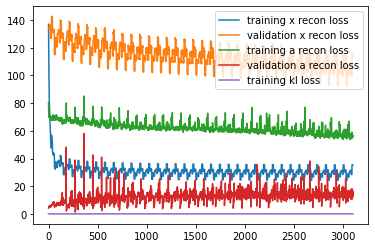

In [13]:
# plt.plot(np.arange(epochs),train_loss_ep)
# plt.plot(np.arange(epochs),val_loss_ep)
plt.plot(np.arange(epochs),train_loss_x_ep)
plt.plot(np.arange(epochs),val_loss_x_ep)
plt.plot(np.arange(epochs),train_loss_a_ep)
plt.plot(np.arange(epochs),val_loss_a_ep)
plt.plot(np.arange(epochs),train_loss_kl_ep)
# plt.plot(np.arange(epochs)[np.array(train_loss_adv_ep)!=None],np.array(train_loss_adv_ep)[np.array(train_loss_adv_ep)!=None]*advWeight)
# plt.plot(np.arange(epochs)[np.array(val_loss_adv_ep)!=None],np.array(val_loss_adv_ep)[np.array(val_loss_adv_ep)!=None]*advWeight)
# plt.plot(np.arange(epochs)[np.array(train_loss_advD_ep)!=None],np.array(train_loss_advD_ep)[np.array(train_loss_advD_ep)!=None]*advWeight)
# plt.plot(np.arange(epochs)[np.array(val_loss_advD_ep)!=None],np.array(val_loss_advD_ep)[np.array(val_loss_advD_ep)!=None]*advWeight)
# plt.plot(np.arange(epochs),np.array(train_loss_clf_ep)*clfweight)
# plt.plot(np.arange(epochs),np.array(val_loss_clf_ep)*clfweight)
# plt.ylim((0,30))
# plt.xlim((8800,9400))
# plt.legend(['training loss','validation loss','training x recon loss','validation x recon loss','training kl loss'],loc='upper right')
# plt.legend(['training x recon loss','validation x recon loss','training kl loss','training classifier loss','validation classifier loss'],loc='upper right')
plt.legend(['training x recon loss','validation x recon loss','training a recon loss','validation a recon loss','training kl loss','training discriminator ae','validation discriminator ae','training discriminator d','validation discriminator d'],loc='upper right')
# plt.legend(['training loss','validation loss','training x recon loss','validation x recon loss','training a recon loss','validation a recon loss','training kl loss','training discriminator ae','validation discriminator ae','training discriminator d','validation discriminator d'],loc='upper right')
plt.savefig(os.path.join(plotsavepath,'loss_seed3.jpg'))
plt.show()


In [17]:
# name='c13k20XA_07_dca'
# logsavepath='/mnt/xinyi/pamrats/log/train_gae_starmap/'+name
# with open(os.path.join(logsavepath,'val_loss_a'), 'rb') as output:
#     val_loss_a_ep=pickle.load(output)
np.argmin(val_loss_a_ep)
# np.where(np.logical_not(np.isfinite(val_loss_ep[:])))
val_loss_a_ep[9990]

2.2546489238739014

In [16]:
testepoch=6600
model.load_state_dict(torch.load(os.path.join(modelsavepath,str(testepoch)+'.pt')))
model.eval()
for s in training_samples:
    print(s)
    
#     adj_norm=adjnormlist[s].cuda().float()
    adj_label=adj_list[s].cuda(0).float()
    features=featureslist[s+'X_'+training_sample_X].cuda().float()
    adj_norm=adjnormlist[s]
#     features=featureslist[s+'X_'+training_sample_X]
    pos_weight=pos_weightlist[s]
    norm=normlist[s]
    
    if 'dca' in model_str:
        features_raw=features_raw_list[s+'X_raw'].cuda()
    num_nodes,num_features = features.shape
#     maskpath=os.path.join(savedir,'trainMask',s+'_'+maskedgeName+'_seed'+str(seed)+'.pkl')
#     if useSavedMaskedEdges and os.path.exists(maskpath):
# #         print('opening saved')
#         with open(maskpath, 'rb') as input:
#             maskedgeres = pickle.load(input)
#     else:
#         # construct training, validation, and test sets
    maskedgeres= preprocessing.mask_nodes_edges(features.shape[0],testNodeSize=testNodes,valNodeSize=valNodes)
#         with open(maskpath, 'wb') as output:
#             pickle.dump(maskedgeres, output, pickle.HIGHEST_PROTOCOL)
    train_nodes_idx,val_nodes_idx,test_nodes_idx = maskedgeres
    
    if s in training_samples:
        test_nodes_idx_s=test_nodes_idx
    else:
        test_nodes_idx_s=torch.tensor(np.arange(num_nodes))
        
#     adj_decode=None
#     if adj_decodeName == 'gala':
#         adj_decode=preprocessing.preprocess_graph_sharp(adj)

    if adj_decodeName==None:
        adj_recon,mu,logvar,z, features_recon = model(features, adj_norm)
    else:
        adj_decode=adj_decode.cuda()
        adj_recon,mu,logvar,z, features_recon = model(features, adj_norm,adj_decode)
    if adv and (s in list(sampleLabellist_ae.keys())):
        sampleLabel_ae=sampleLabellist_ae[s].cuda().float()
        modelAdv.eval()
        advOut=modelAdv(z)
    if 'dca' in model_str:
        loss_x_test=loss_x(features_recon, features,test_nodes_idx_s,XreconWeight,ridgeL,features_raw)
    else:
        loss_x_test=loss_x(features_recon, features,test_nodes_idx_s,XreconWeight,mse)
    loss_a_test=loss_a(adj_recon, adj_label, pos_weight, norm,test_nodes_idx_s)
    loss_test = loss_x_test+loss_a_test
    
    if adv and (s in list(sampleLabellist_ae.keys())):
        loss_adv_test=loss_adv(advOut,sampleLabel_ae,test_nodes_idx)
        print('loss_adv_test: {:.4f}'.format(loss_adv_test.item()))
        
    print('test results',
          'loss_test: {:.4f}'.format(loss_test.item()),
          'loss_x_test: {:.4f}'.format(loss_x_test.item()),
          'loss_a_test: {:.4f}'.format(loss_a_test.item()))
#          'loss_adv_test: {:.4f}'.format(loss_adv_test.item()))
    if protein:
        test_nodes_idx_s_genes=torch.clone(test_nodes_idx_s)
        test_nodes_idx_s_genes[2112:]=0
        test_nodes_idx_s_proteins=torch.clone(test_nodes_idx_s)
        test_nodes_idx_s_proteins[:2112]=0
        if 'dca' in model_str:
            loss_genes_test=loss_x(features_recon, features,test_nodes_idx_s_genes,XreconWeight,ridgeL,features_raw)
            loss_proteins_test=loss_x(features_recon, features,test_nodes_idx_s_proteins,XreconWeight,ridgeL,features_raw)
        print('loss_x_genes: {:.4f}'.format(loss_genes_test.item()),
          'loss_x_proteins: {:.4f}'.format(loss_proteins_test.item()))

   

RuntimeError: CUDA out of memory. Tried to allocate 3.35 GiB (GPU 3; 23.62 GiB total capacity; 17.88 GiB already allocated; 969.12 MiB free; 20.92 GiB reserved in total by PyTorch)

In [12]:
y_true=features
y_true_raw=features_raw
preds=features_recon
mask=nodesmask=torch.tensor(np.arange(num_nodes))
reconWeight=20
eps = 1e-10

output,pi,theta,y_pred=preds
nb_case=optimizer.optimizer_nb(preds,y_true,mask,reconWeight,eps = 1e-10,ifmean=False)- torch.log(pi+eps)

zero_nb = torch.pow(theta/(theta+y_pred+eps), theta)
zero_case = -torch.log(pi + ((1.0-pi)*zero_nb)+eps)
result = torch.where(torch.lt(y_true_raw.cuda(), 1), zero_case, nb_case)

In [13]:
result[:8,:8]

tensor([[-0.0000e+00, 2.1077e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00,
         -0.0000e+00, -0.0000e+00],
        [-0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00,
         -0.0000e+00, -0.0000e+00],
        [1.1921e-07, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00,
         1.1921e-07, -0.0000e+00],
        [1.7968e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, 1.7740e+00,
         1.1915e+00, -0.0000e+00],
        [-0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00,
         1.1921e-07, -0.0000e+00],
        [1.1921e-07, 1.1921e-07, 1.1921e-07, -0.0000e+00, 1.1921e-07, 1.1921e-07,
         1.1921e-07, 1.1921e-07],
        [-0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00,
         -0.0000e+00, -0.0000e+00],
        [-0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00,
         1.4272e+00, -0.0000e+00]], device='cuda:0', grad_fn=<Slic

In [14]:
features[:8,:8]

tensor([[-0.2504,  8.5853, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [ 5.5540, -0.1938, -0.1941, -0.1474, -0.1934,  3.1612,  1.2601, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717, -0.5645, -0.3465],
        [-0.2504, -0.1938, -0.1941, -0.1474, -0.1934, -0.2717,  2.5718, -0.3465]],
       device='cuda:0')

In [15]:
zeroidx=(features_raw==0)
nonzeroidx=(features_raw!=0)
torch.sum(result[zeroidx])/torch.sum(result)

tensor(2.8589e-09, device='cuda:0', grad_fn=<DivBackward0>)

In [22]:
torch.sum(result[zeroidx])

tensor(0., device='cuda:0', grad_fn=<SumBackward0>)

In [13]:
# model.pi.weight[:8,:8]
model_str

'gcn_vae_xa_e2_d1_dca'